In [16]:
import numpy as np
import pandas as pd

In [21]:
url = ("http://hbiostat.org/data/repo/titanic3.xls")

df = pd.read_excel(url)
orig_df = df.drop(columns=["name",
                      "ticket",
                      "home.dest",
                      "boat",
                      "body",
                      "cabin"])

In [22]:
orig_df = pd.get_dummies(orig_df, drop_first=True)

orig_df['sex_male'] = orig_df['sex_male'].astype('int64')
orig_df['embarked_Q'] = orig_df['embarked_Q'].astype('int64')
orig_df['embarked_S'] = orig_df['embarked_S'].astype('int64')

In [23]:
# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# Fix null values in X dataframe for Chapter 8
imp_mode = SimpleImputer(missing_values = np.nan, strategy="median")
cols_to_impute = ["age", "fare"]
orig_df[cols_to_impute] = imp_mode.fit_transform(orig_df[cols_to_impute])

In [24]:
orig_df.isnull().sum()

pclass        0
survived      0
age           0
sibsp         0
parch         0
fare          0
sex_male      0
embarked_Q    0
embarked_S    0
dtype: int64

### Inspect and Clean Data

### Chapter 17 begins here

In [26]:
from sklearn.model_selection import train_test_split


ti_df = orig_df

y = ti_df.survived
X = ti_df.drop(["survived"], axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X = pd.concat([X_train, X_test])
y = pd.concat([y_train, y_test])    

In [27]:
X

,pclass,age,sibsp,parch,fare,sex_male,embarked_Q,embarked_S
1214,3,28.0,0,0,8.6625,1,0,1
677,3,26.0,0,0,7.8958,1,0,1
534,2,19.0,0,0,26.0000,0,0,1
1174,3,28.0,8,2,69.5500,0,0,1
864,3,28.0,0,0,7.7750,0,0,1
...,...,...,...,...,...,...,...,...
325,2,30.0,0,0,13.0000,1,0,1
919,3,18.5,0,0,7.2292,1,0,0
532,2,41.0,0,0,13.0000,1,0,1
1159,3,28.0,0,0,8.0500,0,0,1


### PCA

In [29]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

pca = PCA(random_state=42)
X_pca = pca.fit_transform(StandardScaler().fit_transform(X))
pca.explained_variance_ratio_

array([0.23724161, 0.20653498, 0.19038568, 0.1049897 , 0.08955043,
       0.07572486, 0.05154054, 0.0440322 ])

In [30]:
pca.components_[0]

array([-0.59299362,  0.30811505,  0.13196408,  0.22583681,  0.60844931,
       -0.25011449, -0.21137948, -0.08693554])

[Text(0.5, 0, 'Component'),
 Text(0, 0.5, 'Percent of Explained Variance'),
 Text(0.5, 1.0, 'Scree Plot'),
 (0.0, 1.0)]

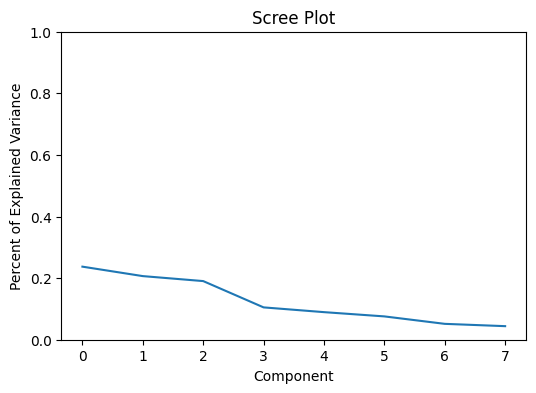

In [32]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(6,4))
ax.plot(pca.explained_variance_ratio_)
ax.set(
    xlabel="Component",
    ylabel="Percent of Explained Variance",
    title="Scree Plot",
    ylim=(0,1))

[Text(0.5, 0, 'Component'),
 Text(0, 0.5, 'Percent of Explained Variance'),
 Text(0.5, 1.0, 'Cumulative Variance'),
 (0.0, 1.0)]

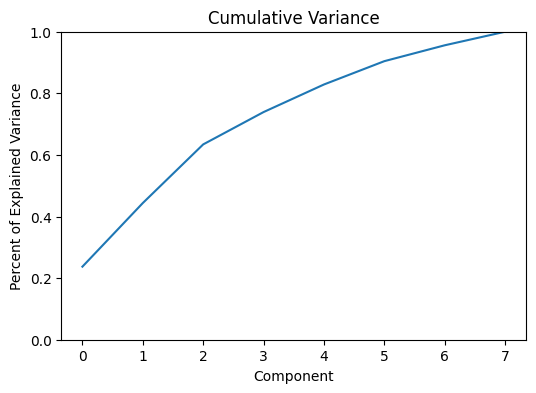

In [33]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(
    np.cumsum(pca.explained_variance_ratio_))
ax.set(
    xlabel = "Component",
    ylabel="Percent of Explained Variance",
    title="Cumulative Variance",
    ylim=(0,1))

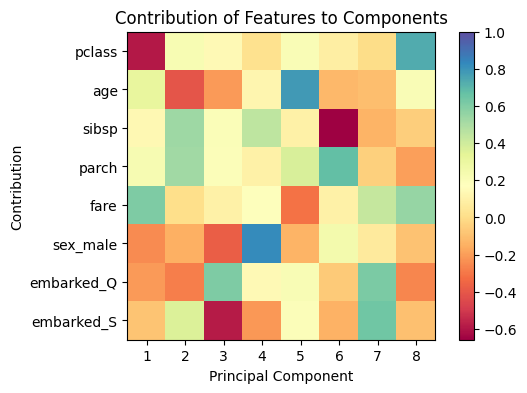

In [34]:
fig, ax = plt.subplots(figsize=(6,4))
plt.imshow(
    pca.components_.T,
    cmap="Spectral",
    vmax=1)
plt.yticks(range(len(X.columns)), X.columns)
plt.xticks(range(8), range(1,9))
plt.xlabel("Principal Component")
plt.ylabel("Contribution")
plt.title("Contribution of Features to Components")
plt.colorbar()

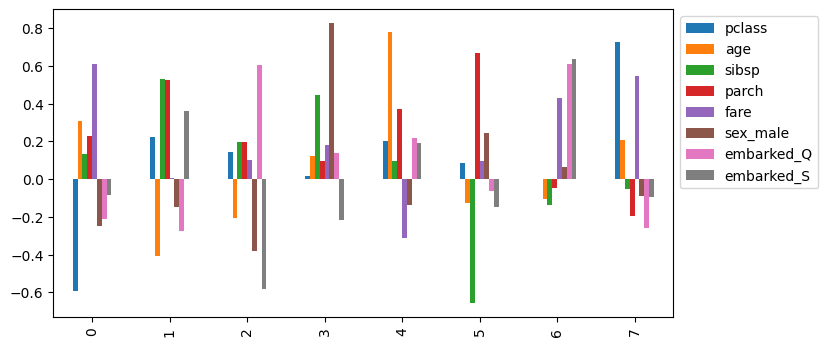

In [35]:
fig, ax = plt.subplots(figsize=(8,4))
pd.DataFrame(
    pca.components_, columns=X.columns
    ).plot(kind="bar", ax=ax).legend(
        bbox_to_anchor=(1,1))

comps = pd.DataFrame(pca.components_, columns=X.columns)
min_val = 0.5
num_components = 2
pca_cols = set()
for i in range(num_components):
    parts = comps.iloc[i][comps.iloc[i].abs()>min_val]
    pca_cols.update(set(parts.index))
pca_cols

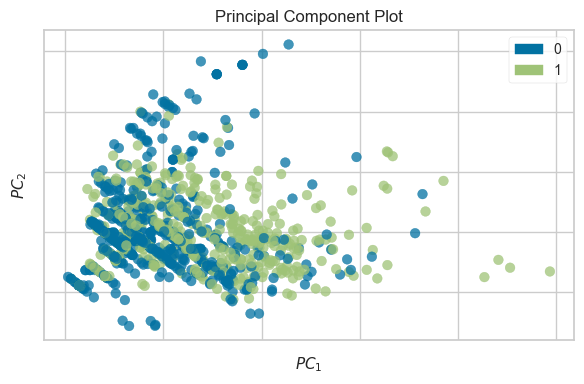

<Axes: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [38]:
from yellowbrick.features.pca import PCADecomposition

fig,ax = plt.subplots(figsize=(6,4))
# this gives a color 'r' to y values of '0' and 'g' for y values of '1'
colors = ["rg"[j] for j in y]
pca_viz = PCADecomposition(color=colors)
pca_viz.fit_transform(X,y)
pca_viz.poof()

<Axes: xlabel='PC1', ylabel='PC2'>

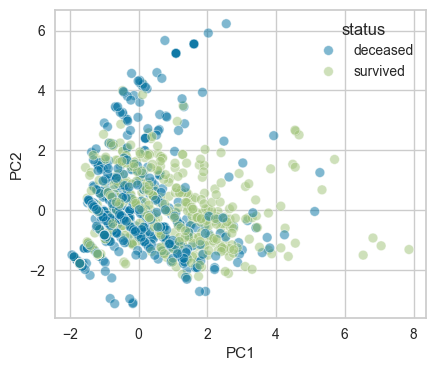

In [96]:
import seaborn as sns

fig, ax = plt.subplots(figsize=(6,4))
pca_df = pd.DataFrame(
    X_pca,
    columns = [
        f"PC{i+1}"
        for i in range(X_pca.shape[1])
    ])
pca_df["status"] = [
        ("deceased","survived")[i] for i in y]
evr = pca.explained_variance_ratio_
ax.set_aspect(evr[1] / evr[0])
sns.scatterplot(
    x="PC1",
    y="PC2",
    hue="status",
    data=pca_df,
    alpha=0.5,
    ax=ax)


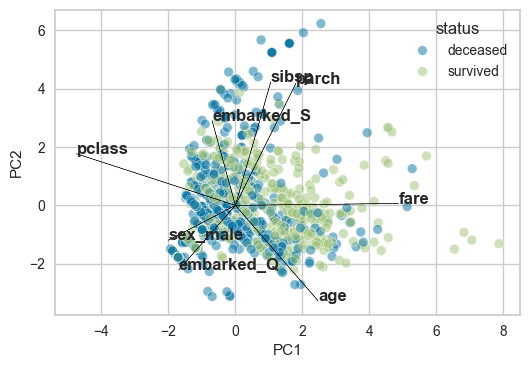

In [44]:
fig, ax = plt.subplots(figsize=(6,4))
pca_df = pd.DataFrame(
    X_pca,
    columns = [
        f"PC{i+1}"
        for i in range(X_pca.shape[1])
    ])
pca_df["status"] = [
        ("deceased","survived")[i] for i in y]
evr = pca.explained_variance_ratio_
x_idx = 0 # x_pc
y_idx = 1 # y_pc
ax.set_aspect(evr[y_idx]/evr[x_idx])
x_col = pca_df.columns[x_idx]
y_col = pca_df.columns[y_idx]

sns.scatterplot(
    x=x_col,
    y=y_col,
    hue="status",
    data=pca_df,
    alpha=0.5,
    ax=ax)
scale = 8
comps = pd.DataFrame(pca.components_, columns=X.columns)
for idx, s in comps.T.iterrows():
    plt.arrow(0,0,s[x_idx]*scale, s[y_idx]*scale, color="k")
    plt.text(s[x_idx]*scale, s[y_idx]*scale, idx, weight="bold")

<Axes: xlabel='PC1', ylabel='PC4'>

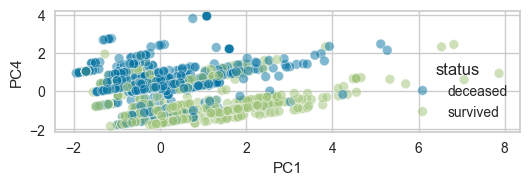

In [47]:
import seaborn as sns

fig, ax = plt.subplots(figsize=(6,4))
pca_df = pd.DataFrame(
    X_pca,
    columns = [
        f"PC{i+1}"
        for i in range(X_pca.shape[1])
    ])
pca_df["status"] = [
        ("deceased","survived")[i] for i in y]
evr = pca.explained_variance_ratio_
#change the evr index values below to change PCA columns
ax.set_aspect(evr[3] / evr[0])
sns.scatterplot(
    x="PC1",
    y="PC4",
    hue="status",
    data=pca_df,
    alpha=0.5,
    ax=ax)


In [49]:
#pip install bokeh

In [71]:
from bokeh.io import output_notebook
from bokeh import models, palettes, transform
from bokeh.plotting import figure, show
def bokeh_scatter(
    x,
    y,
    data,
    hue=None,
    label_cols=None,
    size=None,
    legend=None,
    alpha=0.5,
):
    """
    x - x column name to plot
    y - y column name to plot
    data - pandas DataFrame
    hue - column name to color by (numeric)
    legend - column name to label by
    label_cols - columns to use in tooltip
                 (None all in DataFrame)
    size - size of points in screen space unigs
    alpha - transparency
    """
    output_notebook()
    circle_kwargs = {}
    #if legend:
    #    circle_kwargs["legend"] = legend
    if size:
        circle_kwargs["size"] = size
    if hue:
        color_seq = data[hue]
        mapper = models.LinearColorMapper(
            palette=palettes.viridis(256),
            low=min(color_seq),
            high=max(color_seq),
        )
        circle_kwargs[
            "fill_color"
        ] = transform.transform(hue, mapper)
    ds = models.ColumnDataSource(data)
    if label_cols is None:
        label_cols = data.columns
    tool_tips = sorted(
        [
            (x, "@{}".format(x))
            for x in label_cols
        ],
        key=lambda tup: tup[0],
    )
    hover = models.HoverTool(
        tooltips=tool_tips
    )
    fig = figure(
        tools=[
            hover,
            "pan",
            "zoom_in",
            "zoom_out",
            "reset",
        ],
        toolbar_location="below",
    )
    fig.circle(
        x,
        y,
        source=ds,
        alpha=alpha,
        **circle_kwargs
    )
    show(fig)
    return fig
res = bokeh_scatter(
    "PC1",
    "PC2",
    data=pca_df.assign(
        surv=y.reset_index(drop=True)
    ),
    hue="surv",
    size=10,
    legend="surv",
)

Loading BokehJS ...

In [75]:
### DOES NOT WORK ###
#from yellowbrick.features.pca import PCADecomposition
#colors = ["rg"[j] for j in y]
#pca3_viz = PCADecomposition(proj_dim=3, color=colors)
#pca3_viz.fit_transform(X,y)
#pca3_viz.finalize()
#fig=plt.gcf()
#plt.tight_layout()

In [78]:
# install scprep

In [79]:
import scprep
scprep.plot.rotate_scatter3d(
    X_pca[:, :3],
    c=y,
    cmap="Spectral",
    figsize=(8,6),
    label_prefix="Principal Component")

Text(0.5, 0, 'PC 3')

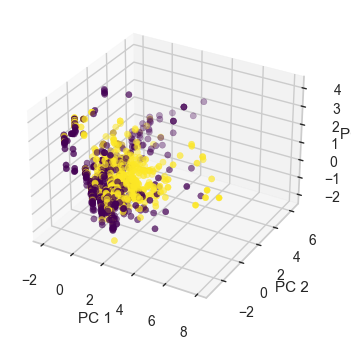

In [82]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(
    xs=X_pca[:, 0],
    ys=X_pca[:, 1],
    zs=X_pca[:, 2],
    c=y,
    cmap="viridis",
)
ax.set_xlabel("PC 1")
ax.set_ylabel("PC 2")
ax.set_zlabel("PC 3")

### UMAP

In [90]:
#pip install umap-learn

In [92]:
#### DID NOT WORK ####
import umap.umap_ as umap
u = umap.UMAP(random_state=42)
X_umap = u.fit_transform(StandardScaler().fit_transform(X))
X_umap.shape

C:\Users\timry\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


(1309, 2)

<Axes: xlabel='0', ylabel='1'>

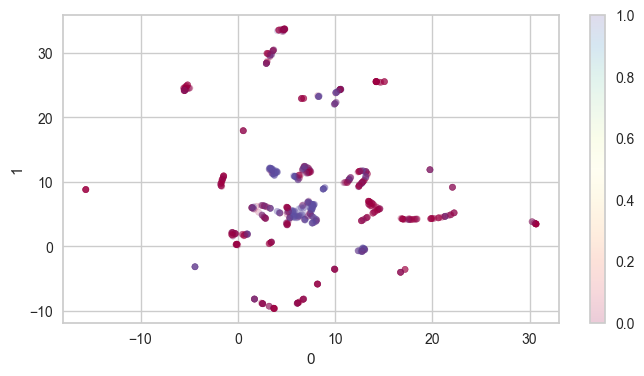

In [99]:
fig, ax = plt.subplots(figsize=(8,4))
pd.DataFrame(X_umap).plot(
    kind="scatter",
    x=0,
    y=1,
    ax=ax,
    c=y,
    alpha=0.2,
    cmap="Spectral")

C:\Users\timry\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\timry\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\timry\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserW

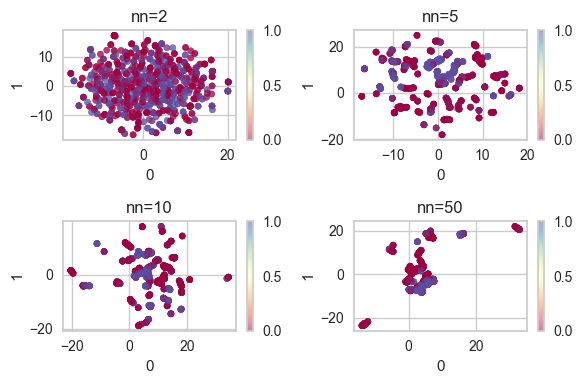

In [102]:
X_std = StandardScaler().fit_transform(X)
fig, axes = plt.subplots(2,2, figsize=(6,4))
axes = axes.reshape(4)
for i, n in enumerate([2, 5, 10, 50]):
    ax=axes[i]
    u = umap.UMAP(
        random_state=42, n_neighbors=n)
    X_umap = u.fit_transform(X_std)
    pd.DataFrame(X_umap).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5)
    ax.set_title(f"nn={n}")
    plt.tight_layout()

C:\Users\timry\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\timry\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\timry\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserW

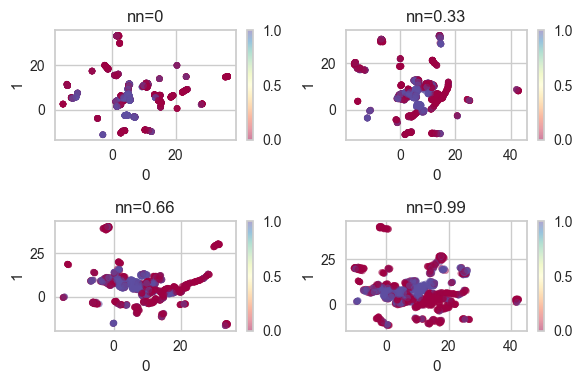

In [104]:
X_std = StandardScaler().fit_transform(X)
fig, axes = plt.subplots(2,2, figsize=(6,4))
axes = axes.reshape(4)
for i, n in enumerate([0, 0.33, 0.66, 0.99]):
    ax=axes[i]
    u = umap.UMAP(
        random_state=42, min_dist=n)
    X_umap = u.fit_transform(X_std)
    pd.DataFrame(X_umap).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5)
    ax.set_title(f"nn={n}")
    plt.tight_layout()

### t-SNE

In [106]:
from sklearn.manifold import TSNE
X_std = StandardScaler().fit_transform(X)
ts=TSNE()
X_tsne = ts.fit_transform(X_std)

Text(0, 0.5, 'Embedding 2')

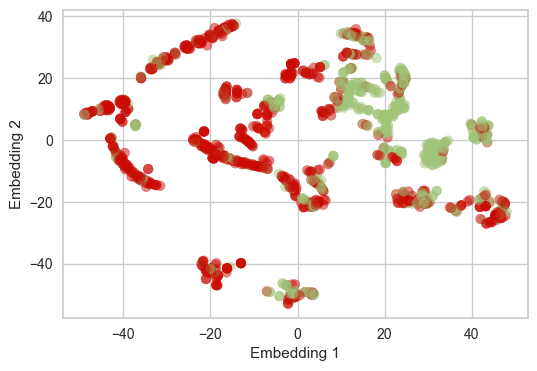

In [107]:
fig, ax = plt.subplots(figsize=(6,4))
colors = ["rg"[j] for j in y]
scat = ax.scatter(
    X_tsne[:,0],
    X_tsne[:,1],
    c=colors,
    alpha=0.5)
ax.set_xlabel("Embedding 1")
ax.set_ylabel("Embedding 2")

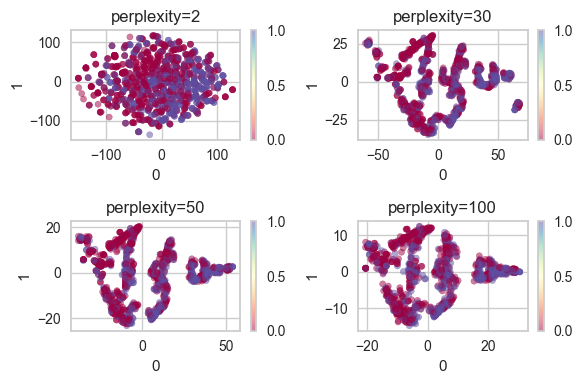

In [111]:
fig, axes = plt.subplots(2,2, figsize=(6,4))
axes = axes.reshape(4)
for i, n in enumerate([2, 30, 50, 100]):
    ax=axes[i]
    t = TSNE(random_state=42, perplexity=n)
    X_tsne = t.fit_transform(X)
    pd.DataFrame(X_tsne).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5)
    ax.set_title(f"perplexity={n}")
    plt.tight_layout()

### PHATE

In [113]:
#pip install phate

In [116]:
import phate
p = phate.PHATE(random_state=42)
X_phate = p.fit_transform(X)
X_phate.shape

Calculating PHATE...
  Running PHATE on 1309 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.06 seconds.
  Calculating optimal t...


C:\Users\timry\anaconda3\Lib\site-packages\graphtools\graphs.py:290: RuntimeWarning: Detected zero distance between 874 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\graphtools\graphs.py:454: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Automatically selected t = 12
  Calculated optimal t in 1.00 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.26 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.99 seconds.
Calculated PHATE in 3.34 seconds.


(1309, 2)

C:\Users\timry\AppData\Local\Temp\ipykernel_8084\1931035631.py:2: DeprecationWarning: Call to deprecated function (or staticmethod) scatter2d. (Use scprep.plot.scatter2d instead) -- Deprecated since version 1.0.0.
  phate.plot.scatter2d(p, c=y, ax=ax, alpha=0.5)


<Axes: >

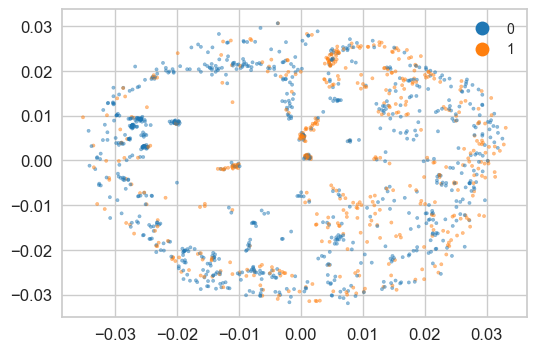

In [118]:
fig, ax = plt.subplots(figsize=(6,4))
phate.plot.scatter2d(p, c=y, ax=ax, alpha=0.5)

Calculating PHATE...
  Running PHATE on 1309 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.06 seconds.
  Calculating optimal t...


C:\Users\timry\anaconda3\Lib\site-packages\graphtools\graphs.py:290: RuntimeWarning: Detected zero distance between 855 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\graphtools\graphs.py:454: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Automatically selected t = 20
  Calculated optimal t in 0.97 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.29 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.84 seconds.
Calculated PHATE in 3.17 seconds.
Calculating PHATE...
  Running PHATE on 1309 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.07 seconds.
  Calculating optimal t...


C:\Users\timry\anaconda3\Lib\site-packages\graphtools\graphs.py:290: RuntimeWarning: Detected zero distance between 874 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
C:\Users\timry\anaconda3\Lib\site-packages\graphtools\graphs.py:454: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Automatically selected t = 12
  Calculated optimal t in 0.98 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.29 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.99 seconds.
Calculated PHATE in 3.35 seconds.
Calculating PHATE...
  Running PHATE on 1309 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.06 seconds.
  Calculating optimal t...


C:\Users\timry\anaconda3\Lib\site-packages\graphtools\graphs.py:290: RuntimeWarning: Detected zero distance between 874 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Automatically selected t = 15
  Calculated optimal t in 0.80 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.33 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.37 seconds.
Calculated PHATE in 3.57 seconds.
Calculating PHATE...
  Running PHATE on 1309 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.08 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 0.18 seconds.
  Calculating optimal t...


C:\Users\timry\anaconda3\Lib\site-packages\graphtools\graphs.py:290: RuntimeWarning: Detected zero distance between 874 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Automatically selected t = 18
  Calculated optimal t in 0.86 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.32 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.04 seconds.
Calculated PHATE in 3.43 seconds.


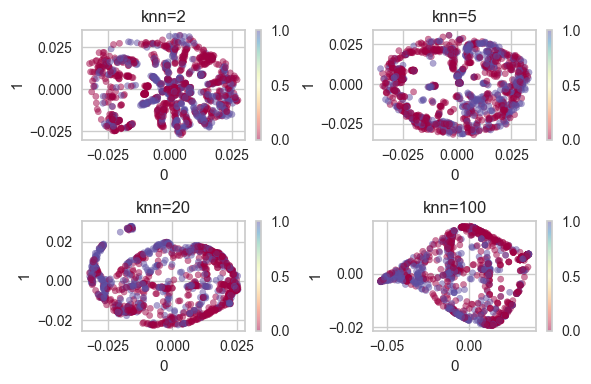

In [120]:
fig, axes = plt.subplots(2,2, figsize=(6,4))
axes = axes.reshape(4)
p = phate.PHATE(random_state=42, n_jobs=-1)

for i, n in enumerate((2,5,20,100)):
    ax=axes[i]
    p.set_params(knn=n)
    X_phate = p.fit_transform(X)
    pd.DataFrame(X_phate).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5)
    ax.set_title(f"knn={n}")
plt.tight_layout()